In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!unzip /content/drive/MyDrive/IR_Project/archive.zip -d /content/drive/MyDrive/IR_Project

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/IR_Project/images/tacos/1026681.jpg  
  inflating: /content/drive/MyDrive/IR_Project/images/tacos/1030289.jpg  
  inflating: /content/drive/MyDrive/IR_Project/images/tacos/1033196.jpg  
  inflating: /content/drive/MyDrive/IR_Project/images/tacos/1036030.jpg  
  inflating: /content/drive/MyDrive/IR_Project/images/tacos/1042175.jpg  
  inflating: /content/drive/MyDrive/IR_Project/images/tacos/1044043.jpg  
  inflating: /content/drive/MyDrive/IR_Project/images/tacos/1058697.jpg  
  inflating: /content/drive/MyDrive/IR_Project/images/tacos/1059239.jpg  
  inflating: /content/drive/MyDrive/IR_Project/images/tacos/1059326.jpg  
  inflating: /content/drive/MyDrive/IR_Project/images/tacos/1066762.jpg  
  inflating: /content/drive/MyDrive/IR_Project/images/tacos/1070967.jpg  
  inflating: /content/drive/MyDrive/IR_Project/images/tacos/1073468.jpg  
  inflating: /content/drive/MyDrive/IR_Project/images/tacos/1

In [3]:
import tensorflow as tf
import matplotlib.image as img
%matplotlib inline
import numpy as np
from collections import defaultdict
import collections
from shutil import copy
from shutil import copytree, rmtree
import tensorflow.keras.backend as K
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras import regularizers
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.regularizers import l2
from tensorflow import keras
from tensorflow.keras import models
import cv2

In [4]:
os.listdir('/content/drive/MyDrive/IR_Project/images')

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [5]:
os.listdir('/content/drive/MyDrive/IR_Project/meta/meta')

['classes.txt',
 'labels.txt',
 'test.json',
 'test.txt',
 'train.json',
 'train.txt']

In [6]:
!head /content/drive/MyDrive/IR_Project/meta/meta/classes.txt

apple_pie
baby_back_ribs
baklava
beef_carpaccio
beef_tartare
beet_salad
beignets
bibimbap
bread_pudding
breakfast_burrito


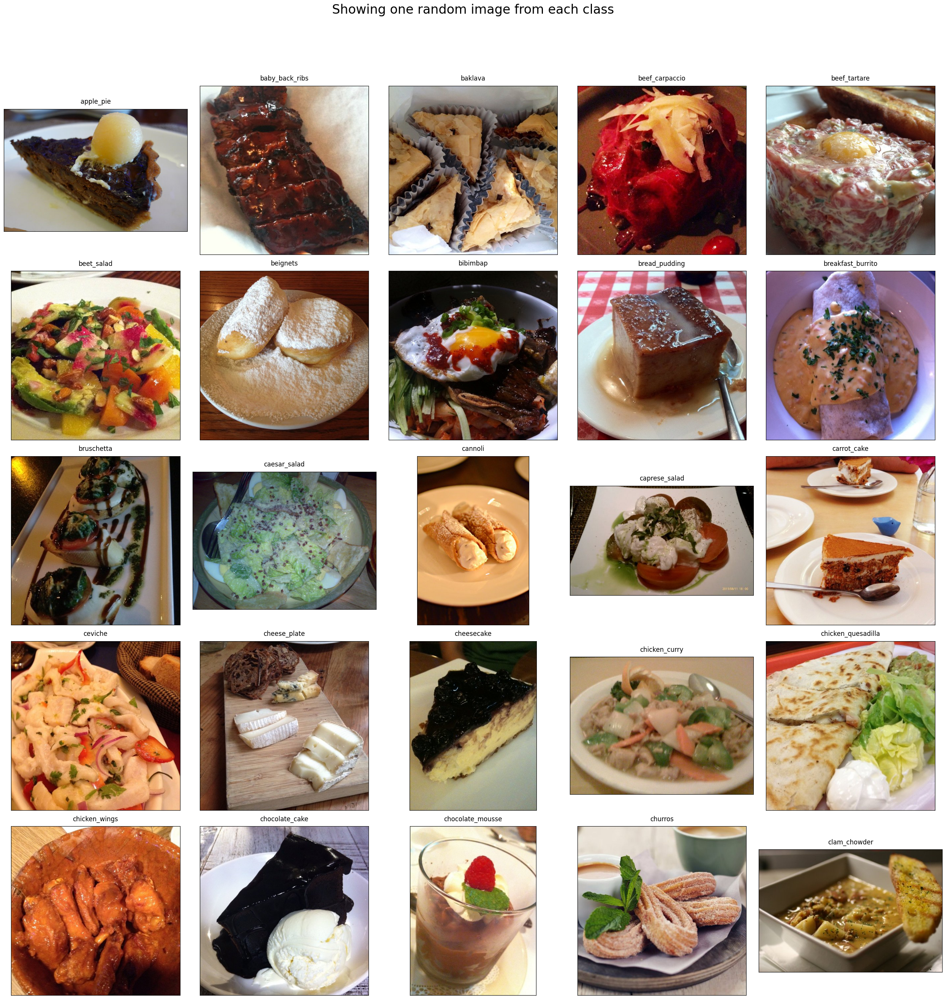

In [7]:
# Visualize the data, showing one image per class from 101 classes
rows = 5
cols = 5
fig, ax = plt.subplots(rows, cols, figsize=(25,25))
fig.suptitle("Showing one random image from each class", y=1.05, fontsize=24) # Adding  y=1.05, fontsize=24 helped me fix the suptitle overlapping with axes issue
data_dir = "/content/drive/MyDrive/IR_Project/images"
foods_sorted = sorted(os.listdir(data_dir))
food_id = 0
for i in range(rows):
  for j in range(cols):
    try:
      food_selected = foods_sorted[food_id] 
      food_id += 1
    except:
      break
    if food_selected == '.DS_Store':
        continue
    food_selected_images = os.listdir(os.path.join(data_dir,food_selected)) # returns the list of all files present in each food category
    food_selected_random = np.random.choice(food_selected_images) # picks one food item from the list as choice, takes a list and returns one random item
    img = plt.imread(os.path.join(data_dir,food_selected, food_selected_random))
    ax[i][j].imshow(img)
    ax[i][j].set_title(food_selected, pad = 10)
    
plt.setp(ax, xticks=[],yticks=[])
plt.tight_layout()

In [8]:
# Helper method to split dataset into train and test folders
def prepare_data(filepath, src,dest):
  classes_images = defaultdict(list)
  with open(filepath, 'r') as txt:
      paths = [read.strip() for read in txt.readlines()]
      for p in paths:
        food = p.split('/')
        classes_images[food[0]].append(food[1] + '.jpg')

  for food in classes_images.keys():
    print("\nCopying images into ",food)
    if not os.path.exists(os.path.join(dest,food)):
      os.makedirs(os.path.join(dest,food))
    for i in classes_images[food]:
      copy(os.path.join(src,food,i), os.path.join(dest,food,i))
  print("Copying Done!")

In [9]:
# Prepare train dataset by copying images from food-101/images to food-101/train using the file train.txt
%cd /
print("Creating train data...")
prepare_data('/content/drive/MyDrive/IR_Project/meta/meta/train.txt', '/content/drive/MyDrive/IR_Project/images', 'train')

/
Creating train data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

Copying 

In [10]:
# Prepare test data by copying images from food-101/images to food-101/test using the file test.txt
print("Creating test data...")
prepare_data('/content/drive/MyDrive/IR_Project/meta/meta/test.txt', '/content/drive/MyDrive/IR_Project/images', 'test')

Creating test data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

Copying ima

In [11]:
# Check how many files are in the train folder
print("Total number of samples in train folder")
!find train -type d -or -type f -printf '.' | wc -c

Total number of samples in train folder
75750


In [12]:
# Check how many files are in the test folder
print("Total number of samples in test folder")
!find test -type d -or -type f -printf '.' | wc -c

Total number of samples in test folder
25250


In [13]:
foods_sorted

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [14]:
# Helper function to select n random food classes
def pick_food_classes(food_indices):
  food_list = []
  for i in food_indices:
    food_list.append(foods_sorted[i])
  food_list.sort()
  return food_list

In [15]:

food_items = pick_food_classes([72,32,10,92,63,23,68,46,64,54,66,76,38,44,9,81,29,42,55,18,14,83,17,21,94,100,58,85,49,25,95,13,48,11,40,98,53,96,20,31,62,90,59,36,67])
print(food_items)

['breakfast_burrito', 'bruschetta', 'caesar_salad', 'caprese_salad', 'carrot_cake', 'cheesecake', 'chicken_curry', 'chicken_wings', 'chocolate_cake', 'churros', 'club_sandwich', 'cup_cakes', 'donuts', 'dumplings', 'falafel', 'fish_and_chips', 'french_fries', 'french_toast', 'fried_rice', 'garlic_bread', 'greek_salad', 'grilled_cheese_sandwich', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'ice_cream', 'lasagna', 'macaroni_and_cheese', 'macarons', 'miso_soup', 'nachos', 'omelette', 'onion_rings', 'pancakes', 'pizza', 'ramen', 'red_velvet_cake', 'samosa', 'spaghetti_bolognese', 'spring_rolls', 'strawberry_shortcake', 'sushi', 'tacos', 'tiramisu', 'waffles']


In [16]:
# Helper method to create train_mini and test_mini data samples
def dataset_mini(food_list, src, dest):
  if os.path.exists(dest):
    rmtree(dest) # removing dataset_mini(if it already exists) folders so that we will have only the classes that we want
  os.makedirs(dest)
  for food_item in food_list :
    print("Copying images into",food_item)
    copytree(os.path.join(src,food_item), os.path.join(dest,food_item))

In [17]:
# Create the new data subset of n classes
src_train = 'train'
dest_train = 'train_mini'
src_test = 'test'
dest_test = 'test_mini'
print("Creating training data folder with new classes...")
dataset_mini(food_items, src_train, dest_train)

Creating training data folder with new classes...
Copying images into breakfast_burrito
Copying images into bruschetta
Copying images into caesar_salad
Copying images into caprese_salad
Copying images into carrot_cake
Copying images into cheesecake
Copying images into chicken_curry
Copying images into chicken_wings
Copying images into chocolate_cake
Copying images into churros
Copying images into club_sandwich
Copying images into cup_cakes
Copying images into donuts
Copying images into dumplings
Copying images into falafel
Copying images into fish_and_chips
Copying images into french_fries
Copying images into french_toast
Copying images into fried_rice
Copying images into garlic_bread
Copying images into greek_salad
Copying images into grilled_cheese_sandwich
Copying images into hamburger
Copying images into hot_and_sour_soup
Copying images into hot_dog
Copying images into ice_cream
Copying images into lasagna
Copying images into macaroni_and_cheese
Copying images into macarons
Copying

In [18]:
print("Total number of samples in train folder")

!find train_mini -type d -or -type f -printf '.' | wc -c

Total number of samples in train folder
33750


In [20]:
print("Creating test data folder with new classes...")
dataset_mini(food_items, src_test, dest_test)

Creating test data folder with new classes...
Copying images into breakfast_burrito
Copying images into bruschetta
Copying images into caesar_salad
Copying images into caprese_salad
Copying images into carrot_cake
Copying images into cheesecake
Copying images into chicken_curry
Copying images into chicken_wings
Copying images into chocolate_cake
Copying images into churros
Copying images into club_sandwich
Copying images into cup_cakes
Copying images into donuts
Copying images into dumplings
Copying images into falafel
Copying images into fish_and_chips
Copying images into french_fries
Copying images into french_toast
Copying images into fried_rice
Copying images into garlic_bread
Copying images into greek_salad
Copying images into grilled_cheese_sandwich
Copying images into hamburger
Copying images into hot_and_sour_soup
Copying images into hot_dog
Copying images into ice_cream
Copying images into lasagna
Copying images into macaroni_and_cheese
Copying images into macarons
Copying ima

In [21]:
print("Total number of samples in test folder")
!find test_mini -type d -or -type f -printf '.' | wc -c

Total number of samples in test folder
11250


In [24]:
# training the InceptionV3 model for food classification
K.clear_session()

n_classes = 45
img_width, img_height = 299, 299
train_data_dir = 'train_mini'
validation_data_dir = 'test_mini'
nb_train_samples = 37500
nb_validation_samples = 12500 
batch_size = 16

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    #batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    #batch_size=batch_size,
    class_mode='categorical')


inception = InceptionV3(weights='imagenet', include_top=False)
x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(128,activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(45,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs=inception.input, outputs=predictions)
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = ModelCheckpoint(filepath='best_model_50class.hdf5', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_50class.log')

history_50class = model.fit_generator(train_generator,
                    validation_data=validation_generator,
                    epochs=5,
                    verbose=1,
                    callbacks=[csv_logger, checkpointer])

model.save('model_trained_50class.hdf5')

Found 33750 images belonging to 45 classes.
Found 11250 images belonging to 45 classes.


<ipython-input-24-5b3dcfd68e29>:46: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_50class = model.fit_generator(train_generator,


Epoch 1/5
1055/1055 [==============================] - ETA: 0s - loss: 1.9086 - accuracy: 0.5502
Epoch 1: val_loss improved from inf to 2.01614, saving model to best_model_50class.hdf5
1055/1055 [==============================] - 1099s 1s/step - loss: 1.9086 - accuracy: 0.5502 - val_loss: 2.0161 - val_accuracy: 0.5052
Epoch 2/5
1055/1055 [==============================] - ETA: 0s - loss: 1.2345 - accuracy: 0.7012
Epoch 2: val_loss improved from 2.01614 to 1.60772, saving model to best_model_50class.hdf5
1055/1055 [==============================] - 1116s 1s/step - loss: 1.2345 - accuracy: 0.7012 - val_loss: 1.6077 - val_accuracy: 0.6297
Epoch 3/5
1055/1055 [==============================] - ETA: 0s - loss: 1.0278 - accuracy: 0.7544
Epoch 3: val_loss did not improve from 1.60772
1055/1055 [==============================] - 1033s 979ms/step - loss: 1.0278 - accuracy: 0.7544 - val_loss: 1.6233 - val_accuracy: 0.6042
Epoch 4/5
1055/1055 [==============================] - ETA: 0s - loss: 0.9

In [25]:
from sklearn.metrics import confusion_matrix, classification_report

In [28]:
test_images = test_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)

Found 33750 images belonging to 45 classes.


In [30]:
predictions = np.argmax(model.predict(test_images), axis=1)

cm = confusion_matrix(test_images.labels, predictions)
clr = classification_report(test_images.labels, predictions, target_names=test_images.class_indices, zero_division=0)

1055/1055 [==============================] - 269s 255ms/step


In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

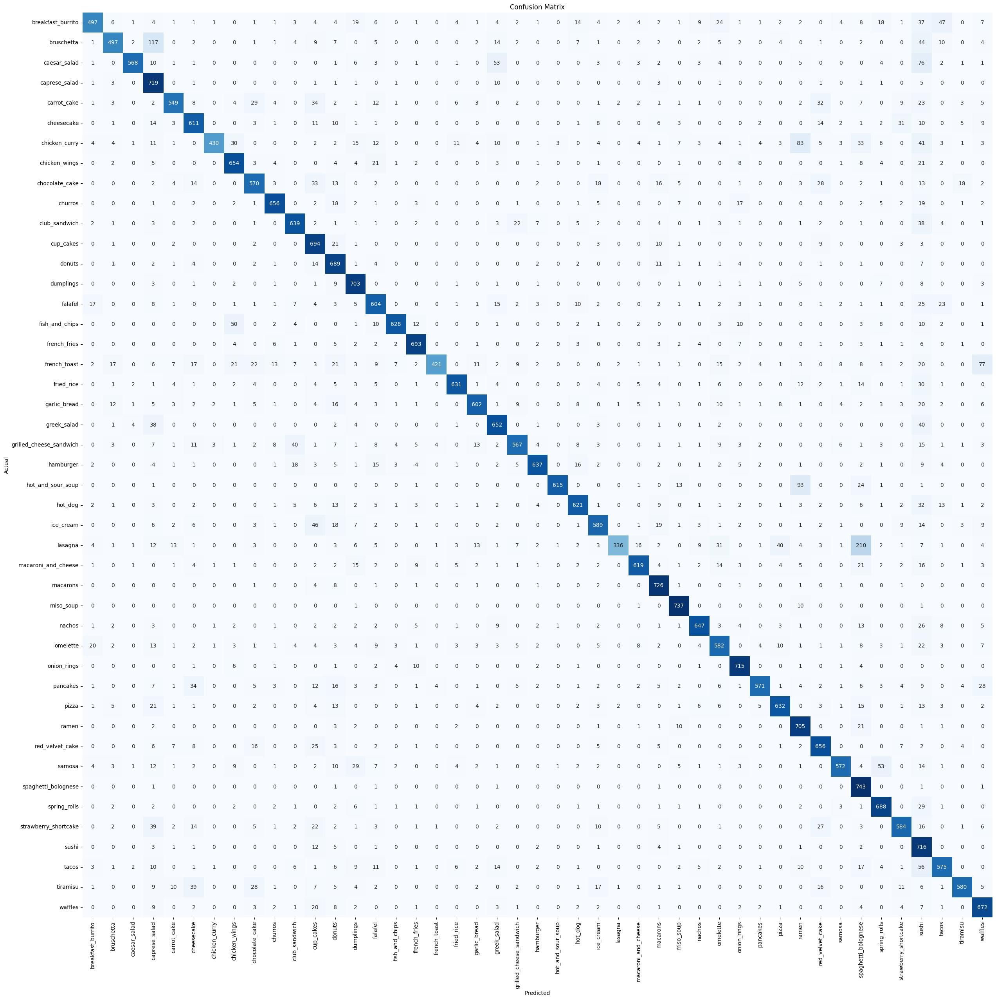

In [36]:
plt.figure(figsize=(30, 30))
sns.heatmap(cm, annot=True, fmt='g', vmin=0, cmap='Blues', cbar=False)
plt.xticks(ticks=np.arange(45) + 0.5, labels=test_images.class_indices, rotation=90)
plt.yticks(ticks=np.arange(45) + 0.5, labels=test_images.class_indices, rotation=0)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [35]:
print("Classification Report:\n----------------------\n", clr)

Classification Report:
----------------------
                          precision    recall  f1-score   support

      breakfast_burrito       0.88      0.66      0.76       750
             bruschetta       0.87      0.66      0.75       750
           caesar_salad       0.97      0.76      0.85       750
          caprese_salad       0.64      0.96      0.77       750
            carrot_cake       0.89      0.73      0.80       750
             cheesecake       0.77      0.81      0.79       750
          chicken_curry       0.98      0.57      0.72       750
          chicken_wings       0.82      0.87      0.85       750
         chocolate_cake       0.80      0.76      0.78       750
                churros       0.91      0.87      0.89       750
          club_sandwich       0.86      0.85      0.86       750
              cup_cakes       0.70      0.93      0.80       750
                 donuts       0.71      0.92      0.80       750
              dumplings       0.81      0.